In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import torch
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
from collections import Counter
from sklearn.preprocessing import label_binarize
import xml.etree.ElementTree as ET
import torch
from sklearn.metrics import (average_precision_score, classification_report,
                             confusion_matrix, ConfusionMatrixDisplay)
from pprint import pprint
import matplotlib.pyplot as plt



In [ ]:
TARGET_FRAMES = 32
COORD_FEATURES = 9
VISUAL_FEATURES = 256 
NUMCLASSES = 5
CLASS = {'Car': 0, 'Van': 1, 'Truck': 2, 'Pedestrian': 3, 'Cyclist': 4}
INVCLASS = {v: k for k, v in CLASS.items()}
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

ALL_VIDEO_SEQ = [("../data/Video_1/Video.xml",
                  "../data/Video_1/calib_cam_to_cam.txt",
                  "../data/Video_1/calib_imu_to_velo.txt",
                  "../data/Video_1/calib_velo_to_cam.txt", "../data/Video_1/sequence_images/", "Video_1"), ("../data/Video_2/Video.xml",
                                                                                                            "../data/Video_2/calib_cam_to_cam.txt",
                                                                                                            "../data/Video_2/calib_imu_to_velo.txt",
                                                                                                            "../data/Video_2/calib_velo_to_cam.txt", "../data/Video_2/sequence_images/", "Video_2"),
                 ("../data/Video_3/Video.xml",
                  "../data/Video_3/calib_cam_to_cam.txt",
                  "../data/Video_3/calib_imu_to_velo.txt",
                  "../data/Video_3/calib_velo_to_cam.txt", "../data/Video_3/sequence_images/", "Video_3"),
                 ("../data/Video_4/Video.xml",
                  "../data/Video_4/calib_cam_to_cam.txt",
                  "../data/Video_4/calib_imu_to_velo.txt",
                  "../data/Video_4/calib_velo_to_cam.txt", "../data/Video_4/sequence_images/", "Video_4"),
                 ("../data/Video_9/Video.xml",
                  "../data/Video_9/calib_cam_to_cam.txt",
                  "../data/Video_9/calib_imu_to_velo.txt",
                  "../data/Video_9/calib_velo_to_cam.txt", "../data/Video_9/sequence_images/", "Video_9"),

                 ("../data/Video_10/Video.xml",
                  "../data/Video_10/calib_cam_to_cam.txt",
                  "../data/Video_10/calib_imu_to_velo.txt",
                  "../data/Video_10/calib_velo_to_cam.txt", "../data/Video_10/sequence_images/", "Video_10"),

                 ("../data/Video_11/Video.xml",
                  "../data/Video_11/calib_cam_to_cam.txt",
                  "../data/Video_11/calib_imu_to_velo.txt",
                  "../data/Video_11/calib_velo_to_cam.txt", "../data/Video_11/sequence_images/", "Video_11"),

                 ("../data/Video_12/Video.xml",
                  "../data/Video_12/calib_cam_to_cam.txt",
                  "../data/Video_12/calib_imu_to_velo.txt",
                  "../data/Video_12/calib_velo_to_cam.txt", "../data/Video_12/sequence_images/", "Video_12"),

                 ("../data/Video_13/Video.xml",
                  "../data/Video_13/calib_cam_to_cam.txt",
                  "../data/Video_13/calib_imu_to_velo.txt",
                  "../data/Video_13/calib_velo_to_cam.txt", "../data/Video_13/sequence_images/", "Video_13"),
                 ]



In [ ]:
trainingSet = ALL_VIDEO_SEQ[0:7] 
validationSet   = ALL_VIDEO_SEQ[7:8]
testSet  = ALL_VIDEO_SEQ[8:9]


Train sequences : 7
Val   sequences : 1
Test  sequences : 1


In [ ]:
def parseCalibirationFile(path):
    calib = {}
    with open(path, 'r') as f:
        for line in f:
            line = line.strip()
            if not line or ':' not in line:
                continue
            key, values = line.split(':', 1)
            try:
                calib[key.strip()] = np.array([float(v) for v in values.split()])
            except ValueError:
                pass 
    return calib   

In [ ]:
def returnPM(camToCamPath, veloToCamPath):
    vc = parseCalibirationFile(veloToCamPath)
    tr_velo_to_cam = np.vstack([np.hstack([vc['R'].reshape(3, 3), vc['T'].reshape(3, 1)]), [0, 0, 0, 1]])  

    cc = parseCalibirationFile(camToCamPath)
    r_rect = np.eye(4)
    r_rect[:3, :3] = cc['R_rect_00'].reshape(3, 3)
    p_rect_02 = cc['P_rect_02'].reshape(3, 4)

    return p_rect_02 @ r_rect @ tr_velo_to_cam

In [ ]:
def create2D(matrix, x, y, z):
    pt_2d = matrix @ np.array([x, y, z, 1.0])
    if pt_2d[2] == 0:
        return 0, 0
    return int(round(pt_2d[0] / pt_2d[2])), int(round(pt_2d[1] / pt_2d[2]))

In [ ]:
class VisionExtractor:
    def __init__(self):
        pretrainedModel = fasterrcnn_resnet50_fpn(pretrained=True)
        self.backbone = pretrainedModel.backbone
        self.backbone.eval()
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.backbone.to(self.device)
        with torch.no_grad():
            self.feature_dim = self.backbone(torch.zeros(1, 3, 224, 224).to(self.device))['0'].shAveragePrecisione[1]
        self.transform = T.Compose([
            T.Resize((224, 224)), T.ToTensor(),
            T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    def extract(self, pil_img):
        with torch.no_grad():
            return torch.mean(self.backbone(self.transform(pil_img).unsqueeze(0).to(self.device))['0'], dim=[2, 3]).cpu().numpy().flatten()

In [ ]:
def create2DBOX(matrix, tx, ty, tz, w, h, l):
    half_w = w / 2.0
    half_l = l / 2.0
    corners_3d = [
        (tx + dw, ty + dl, tz + dh)
        for dw in (-half_w, half_w)
        for dl in (-half_l, half_l)
        for dh in (0, h)
    ]
    us, vs = [], []
    for cx, cy, cz in corners_3d:
        u, v = create2D(matrix, cx, cy, cz)
        us.append(u)
        vs.append(v)

    return min(us), min(vs), max(us), max(vs)

In [ ]:
class KITTIDataset(Dataset):
    def __init__(self, sequences, extractor,set, augment=False,):
        self.sequences = sequences
        self.extractor = extractor
        self.set = set
        self.augment   = augment
        self.X, self.y = self.buildXY()   

  
    def __len__(self):
        return len(self.y)

    def __getitem__(self):
        pass

    def buildXY(self):
        all_X, all_y = [], []

        for xml_path, cam_to_cam, _, velo_to_cam, images_dir, name in self.sequences:
            tracklets = self.parseXML(xml_path)
            p_mat = returnPM(cam_to_cam,velo_to_cam)
            for label, frames in tracklets:
                if label not in CLASS:
                    continue

                seq = self.bulidSequence(frames, images_dir)

                all_X.append(seq)
                all_y.append(CLASS[label])

        np.save(f"../data/numpy_files/all_X_{self.set}.npy", np.array(all_X, dtype=np.float32))
        np.save(f"../data/numpy_files/all_y_{self.set}.npy", np.array(all_y, dtype=np.int64))

        return np.array(all_X, dtype=np.float32), np.array(all_y, dtype=np.int64)
    

    def parseXML(self, xml_path):
        tree = ET.parse(xml_path)
        root = tree.getroot()
        tracklets = []
        for obj in root.findall('.//item'):
            label  = obj.findtext('objectType', default='').strip()
            frames = []
            for frame_idx, pose in enumerate(obj.findall('.//item')):
                tx = float(pose.findtext('tx', '0'))
                ty = float(pose.findtext('ty', '0'))
                tz = float(pose.findtext('tz', '0'))
                rx = float(pose.findtext('rx', '0'))
                ry = float(pose.findtext('ry', '0'))
                rz = float(pose.findtext('rz', '0'))
                w  = float(obj.findtext('w', '0'))
                h  = float(obj.findtext('h', '0'))
                l  = float(obj.findtext('l', '0'))
                frames.append(dict(tx=tx, ty=ty, tz=tz,
                                   rx=rx, ry=ry, rz=rz,
                                   w=w,   h=h,   l=l,
                                   frame_idx=frame_idx)) 
            if frames:
                tracklets.append((label, frames))
        return tracklets

    def bulidSequence(self, frames, images_dir):
        
        if len(frames) >= TARGET_FRAMES:
            if self.augment:
                start = np.random.randint(0, len(frames) - TARGET_FRAMES + 1)
            else:
                start = 0
            frames = frames[start: start + TARGET_FRAMES]
        else:
            pad    = [frames[-1]] * (TARGET_FRAMES - len(frames))
            frames = frames + pad

        seq = []
        for f in frames:
            coord = np.array([f['tx'], f['ty'], f['tz'],
                               f['rx'], f['ry'], f['rz'],
                               f['w'],  f['h'],  f['l']], dtype=np.float32)
            img_path = os.path.join(images_dir, f"{f['frame_idx']:010d}.png")
            if os.path.exists(img_path):
                pil_img = Image.open(img_path).convert('RGB')
                vis = self.extractor.extract(pil_img).astype(np.float32)
            else:
                vis = np.zeros(self.extractor.feature_dim, dtype=np.float32)
            seq.append(np.concatenate([coord, vis]))

        return np.stack(seq) 



In [ ]:
def make(extractor):
    
    print('Building TRAIN dataset ...')
    train_ds = KITTIDataset(trainingSet, extractor, augment=True,set="train")

    print('Building VAL   dataset ...')
    val_ds   = KITTIDataset(validationSet,   extractor, augment=False,set="valdation")

    print('Building TEST  dataset ...')
    test_ds  = KITTIDataset(testSet,  extractor, augment=False,set="test")

    print(f'  train={len(train_ds)}  val={len(val_ds)}  test={len(test_ds)} tracklets')

    return train_ds, val_ds, test_ds


In [ ]:
class TemporalFPNBlock(layers.Layer):
    def __init__(self, out_channels: int = 128, **kwargs):
        super().__init__(**kwargs)
        self.out_channels = out_channels

        self.p3_conv = layers.Conv1D(out_channels, 3, padding='same',
                                     dilation_rate=1, activation='relu', name='p3_conv')
        self.p4_conv = layers.Conv1D(out_channels, 3, padding='same',
                                     dilation_rate=2, activation='relu', name='p4_conv')
        self.p5_conv = layers.Conv1D(out_channels, 3, padding='same',
                                     dilation_rate=4, activation='relu', name='p5_conv')

        self.lat_p4  = layers.Conv1D(out_channels, 1, padding='same', name='lat_p4')
        self.lat_p3  = layers.Conv1D(out_channels, 1, padding='same', name='lat_p3')

        self.merge_p4 = layers.Conv1D(out_channels, 3, padding='same',
                                      activation='relu', name='merge_p4')
        self.merge_p3 = layers.Conv1D(out_channels, 3, padding='same',
                                      activation='relu', name='merge_p3')

        self.out_proj = layers.Conv1D(out_channels, 1, padding='same', name='fpn_out')
        self.bn_out   = layers.BatchNormalization(name='fpn_bn')

    def call(self, x, training=False):
        p4_td = self.merge_p4(self.lat_p4(self.p4_conv(x)) + self.p5_conv(x))
        p3_td = self.merge_p3(self.lat_p3(self.p3_conv(x)) + p4_td)
        output = self.bn_out(self.out_proj(p3_td), training=training)
        return output

    def getConfig(self):
        stage = super().getConfig()
        stage.update({'out_channels': self.out_channels})
        return stage


In [ ]:
def trainingMetrics(history):
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    ax[0].plot(history.history['accuracy'],     label='Train')
    ax[0].plot(history.history['validationAccuracy'], label='Val')
    ax[0].set_title('Model Accuracy')
    ax[0].set_xlabel('Epoch'); ax[0].legend()

    ax[1].plot(history.history['loss'],     label='Train')
    ax[1].plot(history.history['val_loss'], label='Val')
    ax[1].set_title('Model Loss')
    ax[1].set_xlabel('Epoch'); ax[1].legend()

    plt.tight_layout(); 
    plt.show()

In [ ]:
def createConfusionMatrix(y_true, y_pred):
    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(np.array(y_true).flatten().astype(int), np.argmax(y_pred, axis=1),labels=list(CLASS.values())),display_labels=list(CLASS.keys())).plot(cmAveragePrecision='Blues')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

In [ ]:
def create2DBOX(matrix, tx, ty, tz, w, h, l):
    
    half_w = w / 2.0
    half_l = l / 2.0

    corners_3d = [
        (tx + dw, ty + dl, tz + dh)
        for dw in (-half_w, half_w)
        for dl in (-half_l, half_l)
        for dh in (0, h)
    ]

    us, vs = [], []
    for cx, cy, cz in corners_3d:
        u, v = create2D(matrix, cx, cy, cz)
        us.append(u)
        vs.append(v)

    return min(us), min(vs), max(us), max(vs)

In [ ]:
extractor = VisionExtractor()
make(extractor)

c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def stage1FreezeBackbone():
    for p in extractor.backbone.parameters():
        p.requires_grad = False

def stage2Unfreeze():
    for p in extractor.backbone.parameters():
        p.requires_grad = False

    for name, p in extractor.backbone.named_parameters():
        if 'layer4' in name or 'fpn' in name:
            p.requires_grad = True

def stage3UnfreezeAll():
    for p in extractor.backbone.parameters():
        p.requires_grad = False

    for name, p in extractor.backbone.named_parameters():
        if any(block in name for block in ['layer3', 'layer4', 'fpn']):
            p.requires_grad = True


In [20]:
# load numpy files
X_train = np.load(file="../data/numpy_files/all_X_train.npy")   # Videos 9 & 10
y_train = np.load(file="../data/numpy_files/all_y_train.npy")
X_val = np.load(file="../data/numpy_files/all_X_valdation.npy")
y_val = np.load(file="../data/numpy_files/all_y_valdation.npy")
X_test = np.load(file="../data/numpy_files/all_X_test.npy")
y_test = np.load(file="../data/numpy_files/all_y_test.npy")

In [ ]:
def constructModel():
    inp = layers.Input(shape=(TARGET_FRAMES, COORD_FEATURES + VISUAL_FEATURES),
                       name='sequence_input')

    x = layers.Conv1D(128, kernel_size=3, padding='same',
                      activation='relu', name='FirstConv')(inp)
    x = layers.BatchNormalization(name='prefix_bn')(x)

    x = TemporalFPNBlock(out_channels=128, name='TemporalBlock')(x)

    x = layers.Bidirectional(layers.LSTM(128, return_sequences=True),
                             name='BILSTM1')(x)
    x = layers.Bidirectional(layers.LSTM(64), name='BILSTM2')(x)

    x = layers.Dense(128, 'relu', name='fc_head')(x)
    
    x = layers.Dropout(0.5, name='dropout')(x)
    
    out = layers.Dense(NUMCLASSES, 'softmax', name='predictions')(x)

    model = models.Model(inp, out, name='3D-ResNet-Temporal-Stacking-LSTM')
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [ ]:
model = constructModel()
model.summary()

Building Model



Model: "3D-ResNet-Temporal-Stacking-LSTM"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequence_input (InputLayer)     │ (None, 32, 265)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ prefix_conv (Conv1D)            │ (None, 32, 128)        │       101,888 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ prefix_bn (BatchNormalization)  │ (None, 32, 128)        │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ temporal_fpn (TemporalFPNBlock) │ (None, 32, 128)        │       296,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bilstm_1 (Bidirectional)        │ (None, 32, 256)        │       263,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bilstm_2 (Bidirectional)        │ (None, 128)            │       164,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc_head (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 843,525 (3.22 MB)

 Trainable params: 843,013 (3.22 MB)

 Non-trainable params: 512 (2.00 KB)


  Fine-Tuning Stage 1: Frozen backbone — head only
  Learning rate: 0.001  |  Epochs: 100
[Stage 1] Backbone frozen — trainable backbone params: 0 / 26,799,296
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - accuracy: 0.5503 - loss: 1.2741
Epoch 1: val_loss improved from None to 1.19174, saving model to best_model_stage1.keras

Epoch 1: finished saving model to best_model_stage1.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 38s 787ms/step - accuracy: 0.6870 - loss: 1.0375 - val_accuracy: 0.6500 - val_loss: 1.1917 - learning_rate: 0.0010
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.7979 - loss: 0.6879
Epoch 2: val_loss improved from 1.19174 to 1.15205, saving model to best_model_stage1.keras

Epoch 2: finished saving model to best_model_stage1.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 327ms/step - accuracy: 0.8130 - loss: 0.6446 - val_accuracy: 0.6500 - val_loss: 1.1520 - learning_rate: 0.0010
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.7931 - loss: 0.5794
Epoch 

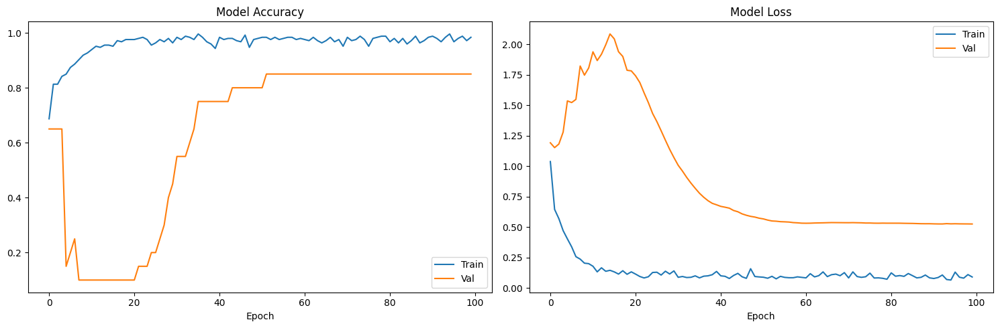


── Test split (Video 13) ──
  Loss: 0.6278  Accuracy: 0.8889
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


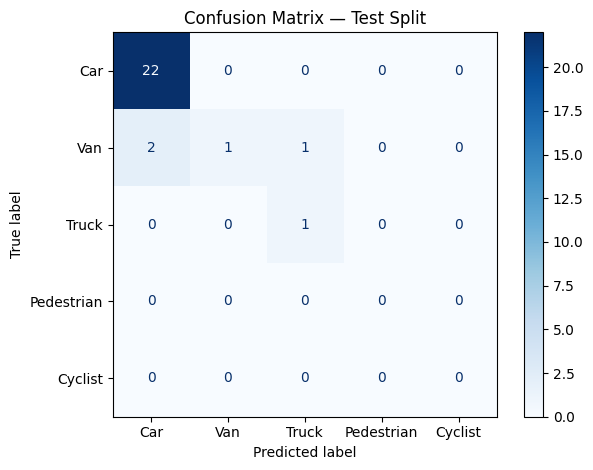

              precision    recall  f1-score   support

         Car       0.92      1.00      0.96        22
         Van       1.00      0.25      0.40         4
       Truck       0.50      1.00      0.67         1
  Pedestrian       0.00      0.00      0.00         0
     Cyclist       0.00      0.00      0.00         0

    accuracy                           0.89        27
   macro avg       0.48      0.45      0.40        27
weighted avg       0.91      0.89      0.86        27


  Fine-Tuning Stage 2: layer4 + FPN unfrozen
  Learning rate: 0.001  |  Epochs: 100
[Stage 2] Unfrozen layer4 + FPN — trainable backbone params: 18,286,592 / 26,799,296
Epoch 1/100


c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted sample

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.8817 - loss: 0.3382
Epoch 1: val_loss improved from None to 1.58492, saving model to best_model_stage2.keras

Epoch 1: finished saving model to best_model_stage2.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 43s 890ms/step - accuracy: 0.8577 - loss: 0.4005 - val_accuracy: 0.4500 - val_loss: 1.5849 - learning_rate: 0.0010
Epoch 2/100
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.8459 - loss: 0.3909
Epoch 2: val_loss improved from 1.58492 to 1.13240, saving model to best_model_stage2.keras

Epoch 2: finished saving model to best_model_stage2.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.8740 - loss: 0.3058 - val_accuracy: 0.6000 - val_loss: 1.1324 - learning_rate: 0.0010
Epoch 3/100
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.9019 - loss: 0.2753
Epoch 3: val_loss improved from 1.13240 to 0.79611, saving model to best_model_stage2.keras

Epoch 3: finished saving model to best_model_stage2.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 26

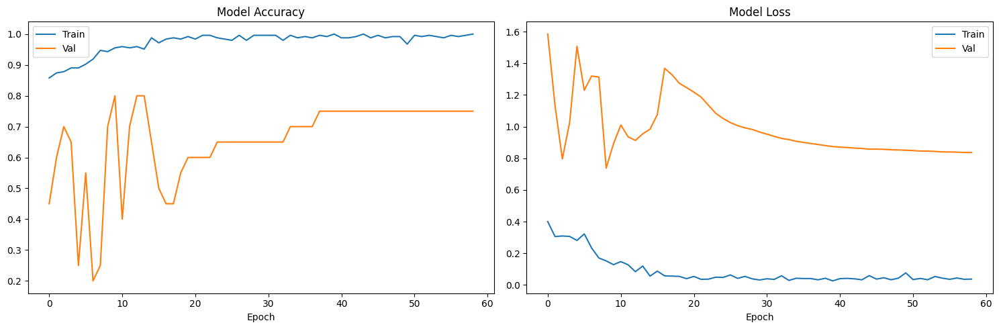


── Test split (Video 13) ──
  Loss: 0.6253  Accuracy: 0.8519
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


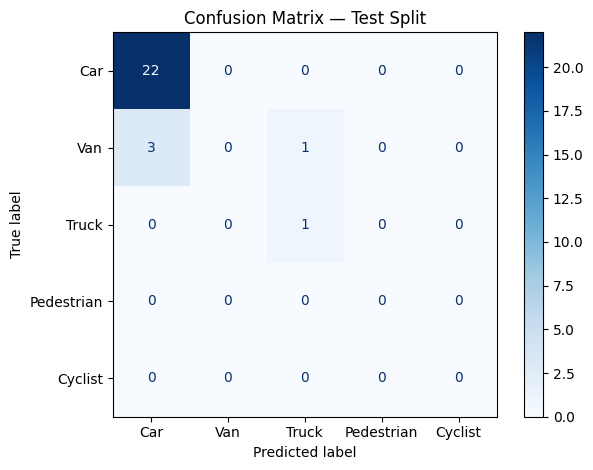

c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted sample

              precision    recall  f1-score   support

         Car       0.88      1.00      0.94        22
         Van       0.00      0.00      0.00         4
       Truck       0.50      1.00      0.67         1
  Pedestrian       0.00      0.00      0.00         0
     Cyclist       0.00      0.00      0.00         0

    accuracy                           0.85        27
   macro avg       0.28      0.40      0.32        27
weighted avg       0.74      0.85      0.79        27


  Fine-Tuning Stage 3: layer3 + layer4 + FPN unfrozen
  Learning rate: 0.001  |  Epochs: 100
[Stage 3] Unfrozen layer3 + layer4 + FPN — trainable backbone params: 25,364,480 / 26,799,296
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.9220 - loss: 0.2192
Epoch 1: val_loss improved from None to 0.57793, saving model to best_model_stage3.keras

Epoch 1: finished saving model to best_model_stage3.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 27s 483ms/step - accuracy: 0.9309 - loss: 0.2108 - val_accuracy: 0

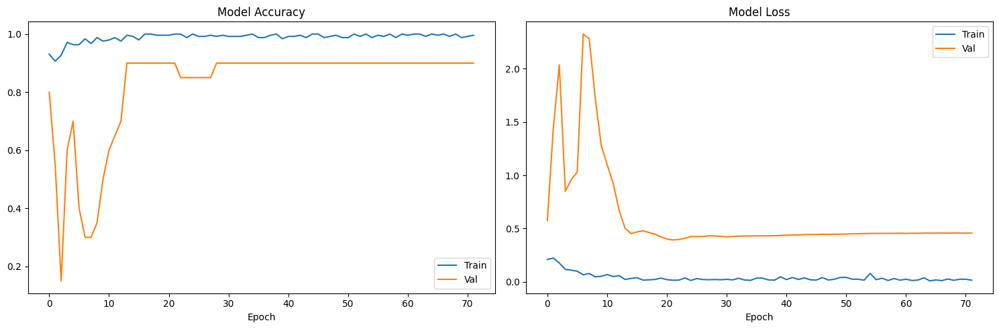


── Test split (Video 13) ──
  Loss: 0.8882  Accuracy: 0.8889
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


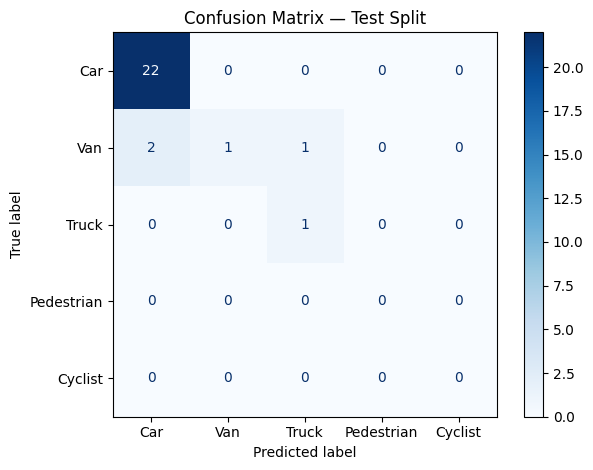

              precision    recall  f1-score   support

         Car       0.92      1.00      0.96        22
         Van       1.00      0.25      0.40         4
       Truck       0.50      1.00      0.67         1
  Pedestrian       0.00      0.00      0.00         0
     Cyclist       0.00      0.00      0.00         0

    accuracy                           0.89        27
   macro avg       0.48      0.45      0.40        27
weighted avg       0.91      0.89      0.86        27


Three-stage fine-tuning complete.


c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted sample

In [ ]:
STAGE_CONFIG = [
    {'stage': 1, 'stageName': stage1FreezeBackbone,
     'desc': 'Frozen backbone — head only'},
    {'stage': 2, 'stageName': stage2Unfreeze,
     'desc': 'layer4 + FPN unfrozen'},
    {'stage': 3, 'stageName': stage3UnfreezeAll,
     'desc': 'layer3 + layer4 + FPN unfrozen'},
]

fineTuned = {}

for stage in STAGE_CONFIG:
    print(f"Fine-Tuning Stage {stage['stage']}: {stage['desc']}")
    print(f"Learning rate: {1e-3}  |  Epochs: {100}")

    stage['stageName'](extractor)
    extractor.backbone.train()

    callBacks = [
        callbacks.EarlyStopping('val_loss', 0, 50, 1, restore_best_weights=True),
        callbacks.ReduceLROnPlateau('val_loss', 0.5, 3, 1, min_lr=1e-7),
        callbacks.ModelCheckpoint(f'bestModelStage{stage["stage"]}.keras','val_loss', 1, True),
    ]
    model.compile(
        tf.keras.optimizers.Adam(1e-3), 'sparse_categorical_crossentropy', None, ['accuracy']
    )

    history = model.fit(X_train, y_train, 32, 100, 1, callBacks, 0,(X_val, y_val))
    fineTuned[f'stage{stage["stage"]}'] = history
    trainingMetrics(history)
    print('\nTest split (Video 13)')
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    print(f'  Loss: {test_loss:.4f}  Accuracy: {test_acc:.4f}')

    y_testPrediction = model.predict(X_test)

    createConfusionMatrix(y_test, y_testPrediction)
    print(classification_report(
        y_test,
        np.argmax(y_testPrediction, axis=1),
        list(CLASS.values()), list(CLASS.keys())))


print('\nThree-stage fine-tuning complete.')

In [ ]:
AveragePrecisionPerClass = {}
for cls_idx, cls_name in INVCLASS.items():
    AveragePrecisionPerClass[cls_name] = average_precision_score(label_binarize(y_test, classes=list(CLASS.values())) [:, cls_idx], y_testPrediction[:, cls_idx])
    print(f'Average Precision  {cls_name:<12}: {average_precision_score(label_binarize(y_test, classes=list(CLASS.values())) [:, cls_idx], y_testPrediction[:, cls_idx]):.4f}')
    
weighted_MeanAveragePrecision = sum(AveragePrecisionPerClass[INVCLASS[c]] * Counter(y_test.tolist())[c] / sum(Counter(y_test.tolist()).values()) for c in range(NUMCLASSES))
print(f'\nWeighted mAveragePrecision: {weighted_MeanAveragePrecision:.4f}')


  AP  Car         : 0.8973
  AP  Van         : 0.5851
  AP  Truck       : 1.0000
  AP  Pedestrian  : 0.0000
  AP  Cyclist     : 0.0000

Weighted mAP: 0.8549


c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\kumbi\OneDrive\Documents\GitHub\3D-ResNet-Temporal-Stacking-LSTM\.venv\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


In [ ]:
def visualize_inference(img_path, matrix, tx, ty, tz, w, h, l,
                        pI, tI):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Image not found: {img_path}")
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_h, img_w = img.shAveragePrecisione[:2]

    firstMin, secondMIn, firstMax, secondMax = create2DBOX(
        matrix, tx, ty, tz, w, h, l
    )

    firstMin = max(0, min(firstMin, img_w - 1))
    secondMIn = max(0, min(secondMIn, img_h - 1))
    firstMax = max(0, min(firstMax, img_w - 1))
    secondMax = max(0, min(secondMax, img_h - 1))

    if pI == tI:
        color = (0, 255, 0)
    else:
        color = (255, 0, 0)

    cv2.rectangle(img, (firstMin, secondMIn), (firstMax, secondMax), color, 2)
    cv2.putText(img, (f"Pred: {INVCLASS[pI]} | "f"True: {INVCLASS[tI]}"), (firstMin, max(secondMIn - 10, 15)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    plt.figure(figsize=(12, 7))
    plt.imshow(img)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

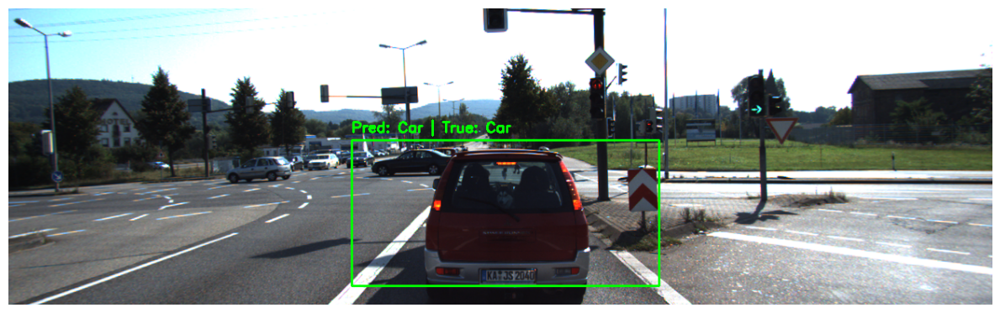

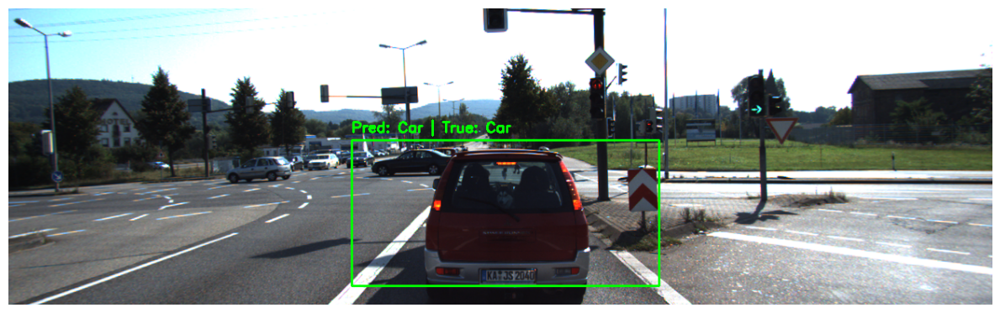

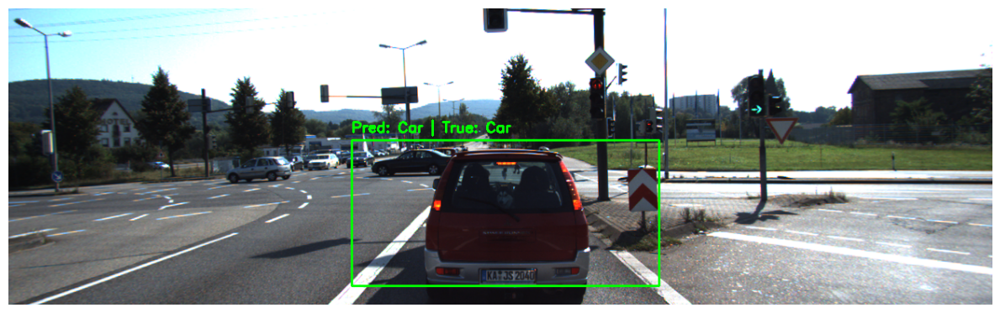

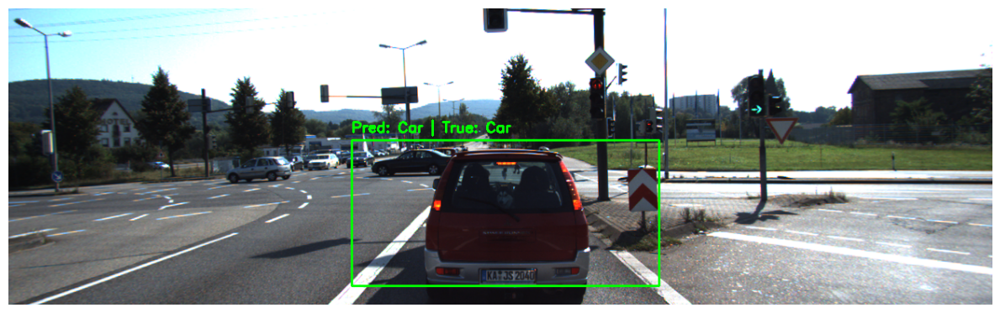

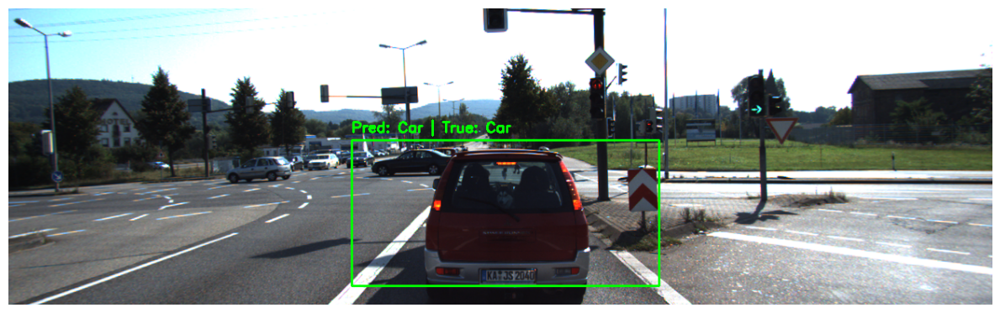

...

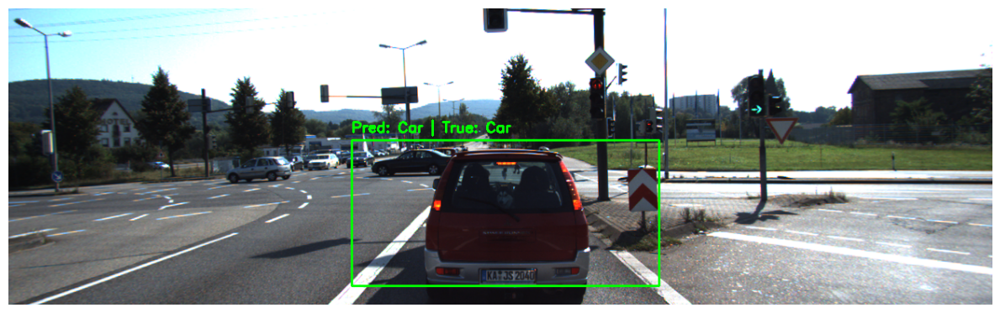

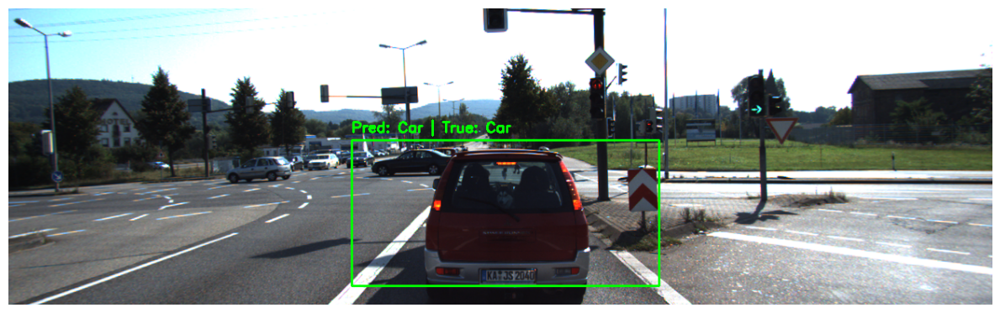

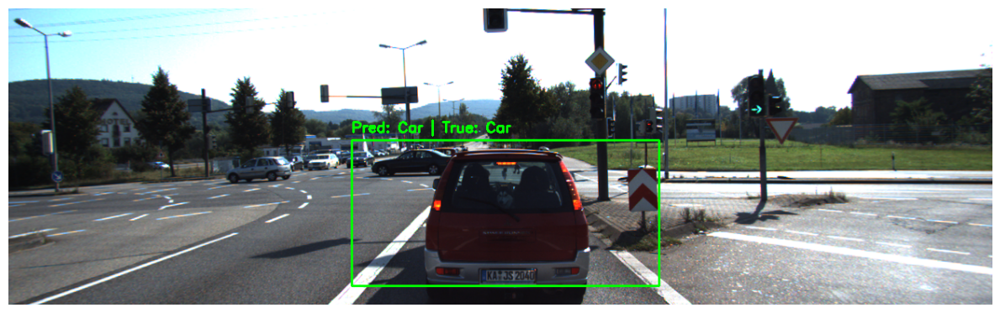

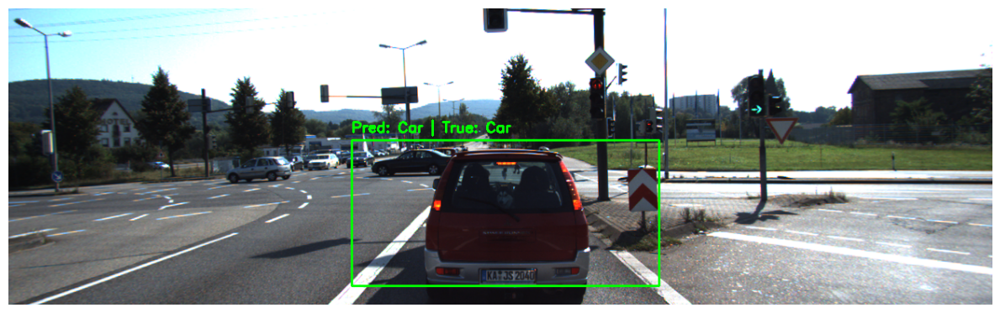

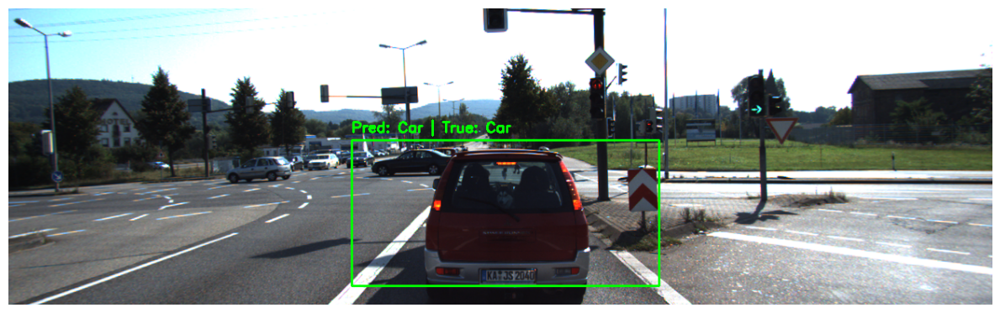

In [ ]:
SAMPLE_IDX = 0

xml_path, cam_to_cam, _, velo_to_cam, images_dir, video_name = testSet[0]
img_path  = os.path.join(images_dir, f'{0:010d}.png')
tx, ty, tz,w,h,l = X_test[SAMPLE_IDX, 0, 0], X_test[SAMPLE_IDX, 0, 1], X_test[SAMPLE_IDX, 0, 2], X_test[SAMPLE_IDX,0,6], X_test[SAMPLE_IDX,0,7],X_test[SAMPLE_IDX,0,8]

visualize_inference(img_path, returnPM(cam_to_cam, velo_to_cam), tx, ty, tz,w,h,l,int(np.argmax(y_testPrediction[SAMPLE_IDX])), int(y_test[SAMPLE_IDX]))
